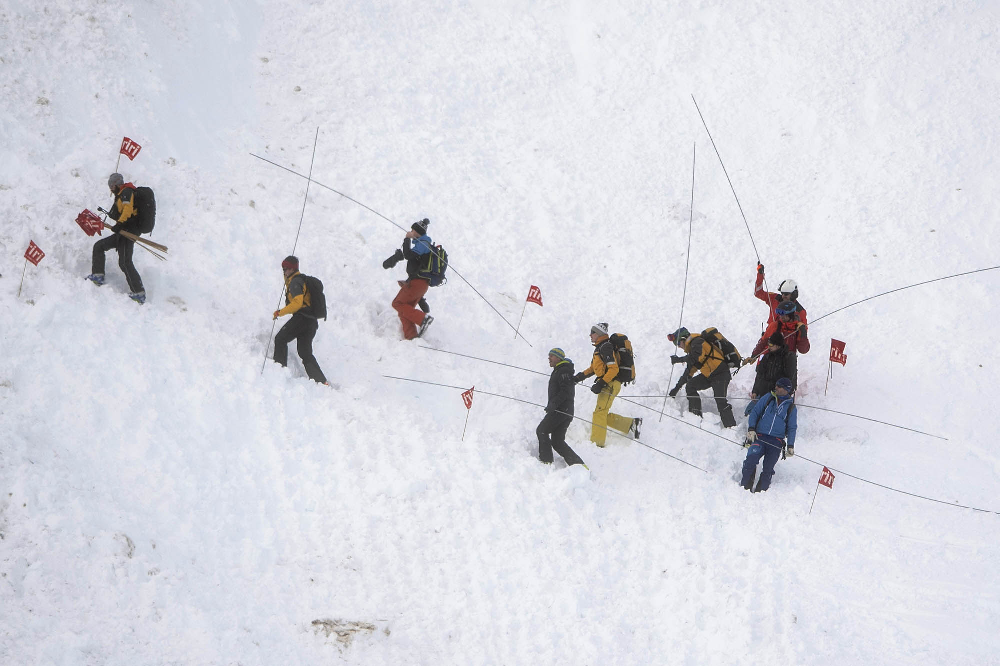

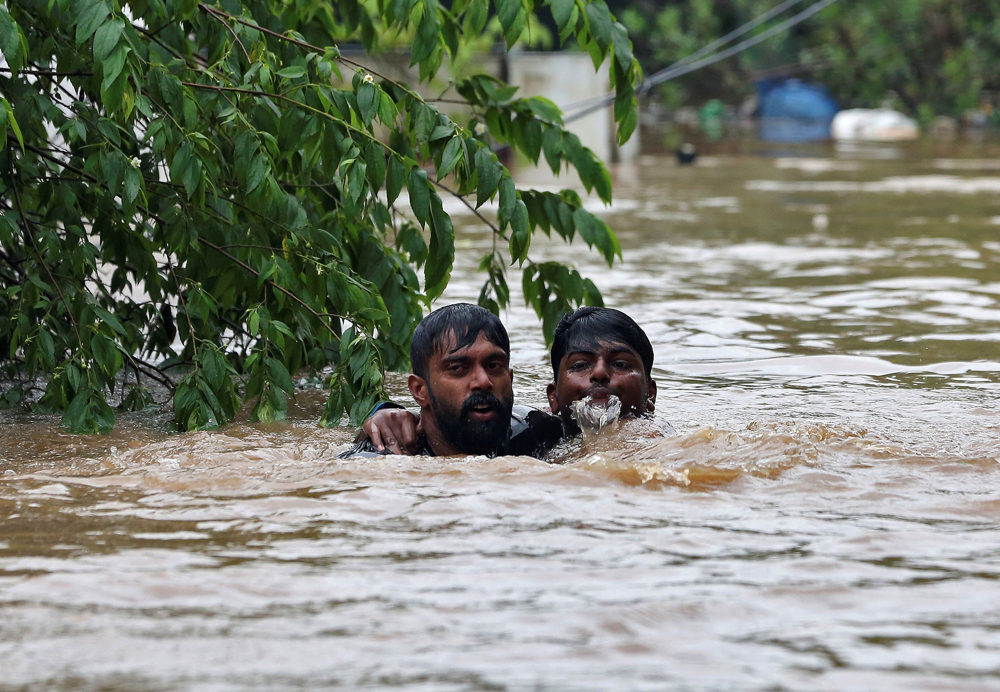

In [23]:
import cv2
from urllib.request import urlretrieve
from google.colab.patches import cv2_imshow

# save the foreground and background to our local storage
urlretrieve('https://nypost.com/wp-content/uploads/sites/2/2019/12/switzerland-avalanche.jpg', '/content/foreground1.jpg')
#urlretrieve('https://s.abcnews.com/images/International/turkey-syria-earthquake-02-ap-jt-230207_1675800390462_hpMain_2_16x9_992.jpg', '/content/foreground2.jpg')
urlretrieve('https://cdn.theatlantic.com/media/img/photo/2018/08/monsoon-flooding-in-kerala-india/k01_RTS1XM0V-1/original.jpg', '/content/foreground2.jpg')

# display the images in the notebook
cv2_imshow(cv2.imread('/content/foreground1.jpg'))
cv2_imshow(cv2.imread('/content/foreground2.jpg'))

In [2]:
!pip install -qr https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt

import torch
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.7 MB/s eta 0:00:00
Setup complete. Using torch 2.0.0+cu118 (CPU)


In [24]:
import torch
import torch
from IPython.display import clear_output

# Load the model from torch.hub
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

# Setup the paths of the 2 foregrounds in a list to run the model on 
dir = '/content/'
imgs = [dir + f for f in ('foreground1.jpg', 'foreground2.jpg')]

# Inference, run the model on the 2 foreground images
results = model(imgs, size=640)
clear_output()

# Print out a summary of the inference job, we ran it on 2 images, at what speed and what detections were made
results.print()


image 1/2: 1333x2000 8 persons, 8 backpacks
image 2/2: 1384x2000 2 persons
Speed: 64.1ms pre-process, 301.4ms inference, 1.3ms NMS per image at shape (2, 3, 448, 640)


In [27]:
results.pandas().xyxy[0]
#results.pandas().xyxy[1]

,xmin,ymin,xmax,ymax,confidence,class,name
0,1073.495483,693.202087,1167.910767,942.914124,0.835715,0,person
1,1479.756226,751.384521,1592.261719,989.078552,0.813363,0,person
2,539.736877,509.606812,666.596497,770.676147,0.799345,0,person
3,157.979431,340.612793,314.865082,606.264587,0.701385,0,person
4,1330.796875,650.619629,1483.951782,864.645569,0.675082,0,person
5,1158.086548,645.389160,1268.838989,897.812073,0.641922,0,person
6,1403.190308,656.280396,1481.132812,746.591614,0.549356,24,backpack
7,1487.023804,554.183899,1615.716919,812.670227,0.524987,0,person
8,764.086426,428.873688,892.884766,667.439209,0.434118,0,person
9,1204.094482,663.485657,1270.502930,766.262695,0.399908,24,backpack


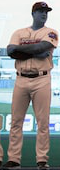

In [9]:
# x0, y0, x1, y1, _, _ = results.xyxy[0][0].numpy().astype(int) 

## crop/clip the image and show it
# cropped_image = results.ims[0][y0:y1, x0:x1]
# cv2_imshow(cropped_image)

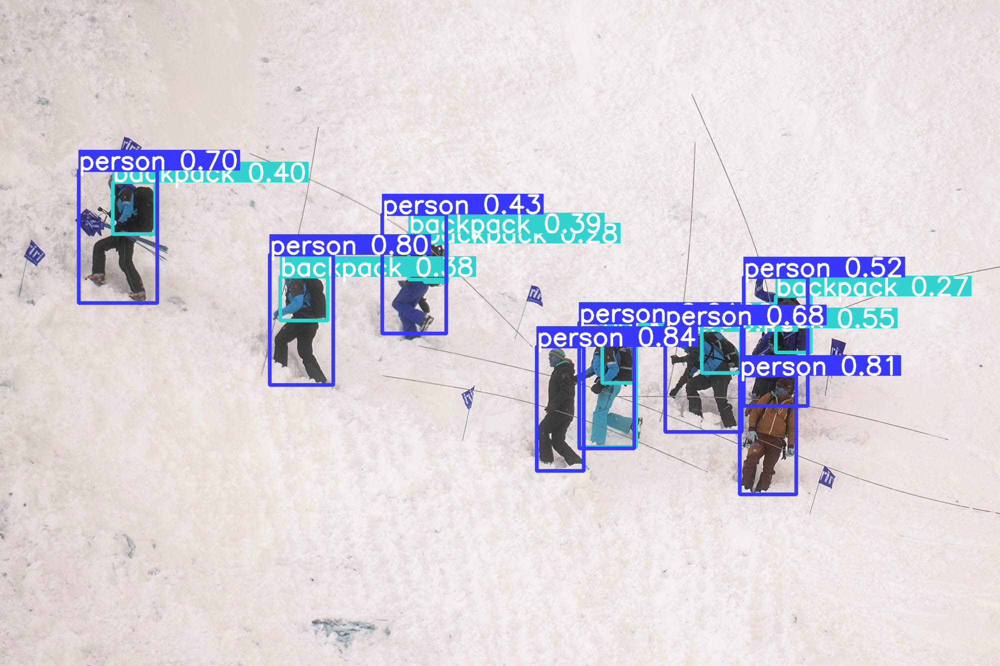

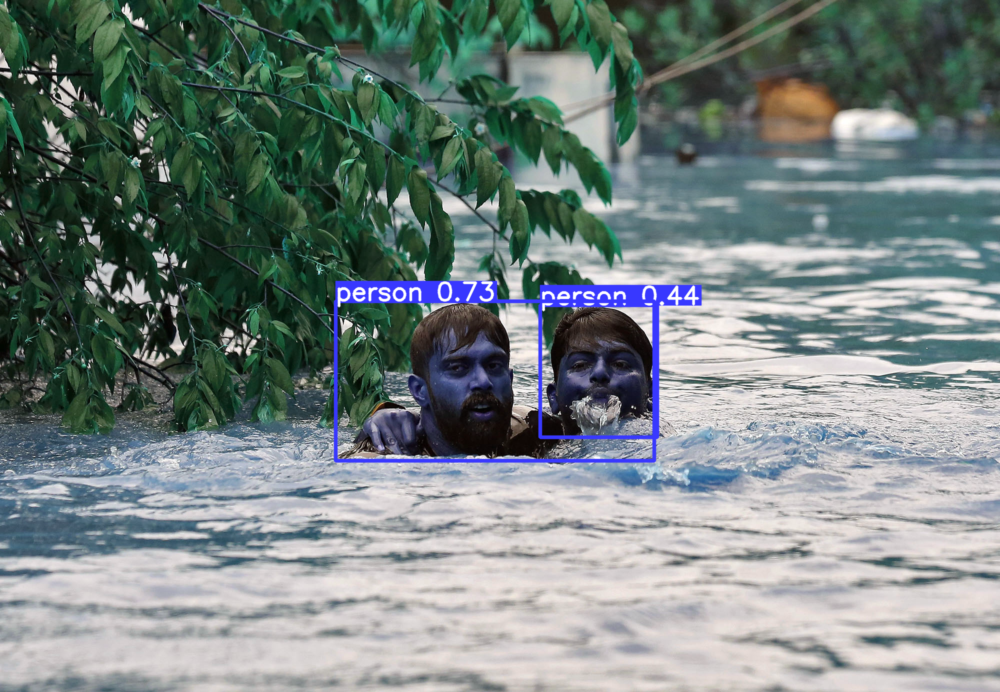

In [25]:
results.render()
cv2_imshow(results.ims[0])
cv2_imshow(results.ims[1])